# Product Detection and Personalized Recommendations For Interior Design Platforms Using InceptionV3 

### Importing Libraries

In [2]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support, classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array, ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.utils import to_categorical
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

### Data Collection

In [3]:
Directory1='Rooms'
Directory2='Products'

In [4]:
images=[]
labels=[]
for directory in [Directory1, Directory2]:
    for file in os.listdir(directory):
        if file.endswith(('png', 'jpg', 'jpeg')):
            img_path = os.path.join(directory, file)
            # Load image and resize to 299x299 (required input shape for InceptionV3)
            image=Image.open(img_path).resize((299, 299))
            image=img_to_array(image)
            images.append(image)
            # Appending labels to the labels list
            labels.append(directory)

In [5]:
totalbedroomimages=len([file for file in os.listdir(Directory1) if file.endswith(('png', 'jpg', 'jpeg'))])
totalproductimages=len([file for file in os.listdir(Directory2) if file.endswith(('png', 'jpg', 'jpeg'))])
print(f"Number of images in 'Bedroom' directory: {totalbedroomimages}")
print(f"Number of images in 'Products' directory: {totalproductimages}")

Number of images in 'Bedroom' directory: 36
Number of images in 'Products' directory: 11


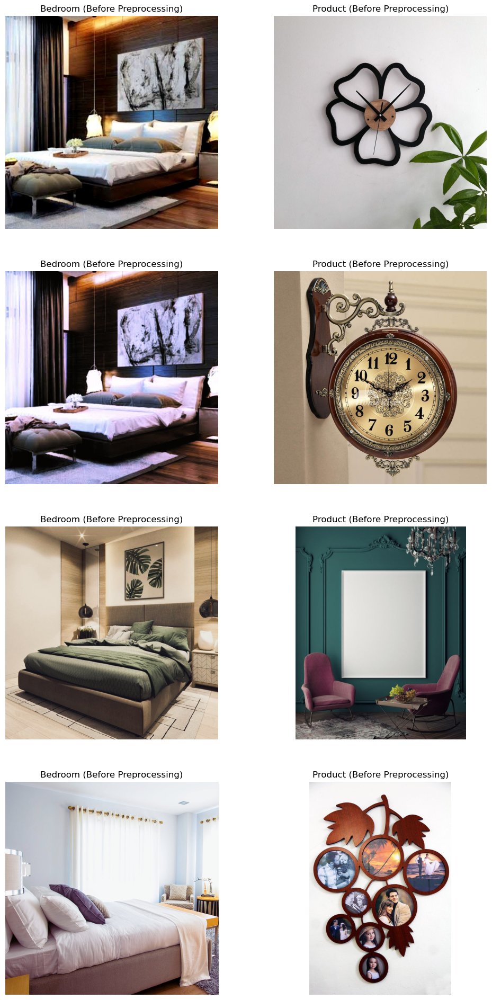

In [6]:
# Data Visualization - Before Preprocessing
fig, axes = plt.subplots(4, 2, figsize=(12, 24))
indices=[0, 4, 8, 12]
bedroomfiles=[file for idx, file in enumerate(os.listdir(Directory1)) if file.endswith(('png', 'jpg', 'jpeg')) and idx in indices]
productfiles=[file for file in os.listdir(Directory2) if file.endswith(('png', 'jpg', 'jpeg'))][:4]

for i in range(4):
    roompath=os.path.join(Directory1, bedroomfiles[i])
    productpath=os.path.join(Directory2, productfiles[i])

    roomimage=Image.open(roompath)
    productimage=Image.open(productpath)

    axes[i, 0].imshow(roomimage)
    axes[i, 0].set_title('Bedroom (Before Preprocessing)')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(productimage)
    axes[i, 1].set_title('Product (Before Preprocessing)')
    axes[i, 1].axis('off')

plt.show()

### Feature Extraction

In [7]:
# Convert lists to numpy arrays
images=np.array(images)
labels=np.array(labels)

In [8]:
# Encode labels into categorical format
labelmapping = {Directory1: 0, Directory2: 1}
encodedlabels = np.array([labelmapping[label] for label in labels])
encodedlabels = to_categorical(encodedlabels)

### Data Preprocessing

In [9]:
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(images)

In [11]:
inception_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

In [12]:
inception_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 149, 149, 32)         864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 149, 149, 32)         96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 149, 149, 32)         0         ['batch_normalizati

                                                                                                  
 conv2d_105 (Conv2D)         (None, 35, 35, 32)           6144      ['average_pooling2d_9[0][0]'] 
                                                                                                  
 batch_normalization_99 (Ba  (None, 35, 35, 64)           192       ['conv2d_99[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_101 (B  (None, 35, 35, 64)           192       ['conv2d_101[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_104 (B  (None, 35, 35, 96)           288       ['conv2d_104[0][0]']          
 atchNorma

 )                                                                  ]']                           
                                                                                                  
 activation_111 (Activation  (None, 35, 35, 96)           0         ['batch_normalization_111[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_112 (Activation  (None, 35, 35, 64)           0         ['batch_normalization_112[0][0
 )                                                                  ]']                           
                                                                                                  
 mixed1 (Concatenate)        (None, 35, 35, 288)          0         ['activation_106[0][0]',      
                                                                     'activation_108[0][0]',      
          

 )                                                                  ]']                           
                                                                                                  
 conv2d_122 (Conv2D)         (None, 35, 35, 96)           55296     ['activation_121[0][0]']      
                                                                                                  
 batch_normalization_122 (B  (None, 35, 35, 96)           288       ['conv2d_122[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_122 (Activation  (None, 35, 35, 96)           0         ['batch_normalization_122[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_12

                                                                                                  
 conv2d_124 (Conv2D)         (None, 17, 17, 192)          147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_127 (Conv2D)         (None, 17, 17, 192)          172032    ['activation_126[0][0]']      
                                                                                                  
 conv2d_132 (Conv2D)         (None, 17, 17, 192)          172032    ['activation_131[0][0]']      
                                                                                                  
 conv2d_133 (Conv2D)         (None, 17, 17, 192)          147456    ['average_pooling2d_12[0][0]']
                                                                                                  
 batch_normalization_124 (B  (None, 17, 17, 192)          576       ['conv2d_124[0][0]']          
 atchNorma

 activation_141 (Activation  (None, 17, 17, 160)          0         ['batch_normalization_141[0][0
 )                                                                  ]']                           
                                                                                                  
 average_pooling2d_13 (Aver  (None, 17, 17, 768)          0         ['mixed4[0][0]']              
 agePooling2D)                                                                                    
                                                                                                  
 conv2d_134 (Conv2D)         (None, 17, 17, 192)          147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_137 (Conv2D)         (None, 17, 17, 192)          215040    ['activation_136[0][0]']      
                                                                                                  
 conv2d_14

 atchNormalization)                                                                               
                                                                                                  
 activation_146 (Activation  (None, 17, 17, 160)          0         ['batch_normalization_146[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_151 (Activation  (None, 17, 17, 160)          0         ['batch_normalization_151[0][0
 )                                                                  ]']                           
                                                                                                  
 average_pooling2d_14 (Aver  (None, 17, 17, 768)          0         ['mixed5[0][0]']              
 agePooling2D)                                                                                    
          

                                                                                                  
 batch_normalization_156 (B  (None, 17, 17, 192)          576       ['conv2d_156[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_161 (B  (None, 17, 17, 192)          576       ['conv2d_161[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_156 (Activation  (None, 17, 17, 192)          0         ['batch_normalization_156[0][0
 )                                                                  ]']                           
                                                                                                  
 activatio

 )                                                                  ]']                           
                                                                                                  
 conv2d_165 (Conv2D)         (None, 8, 8, 320)            552960    ['activation_164[0][0]']      
                                                                                                  
 conv2d_169 (Conv2D)         (None, 8, 8, 192)            331776    ['activation_168[0][0]']      
                                                                                                  
 batch_normalization_165 (B  (None, 8, 8, 320)            960       ['conv2d_165[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_169 (B  (None, 8, 8, 192)            576       ['conv2d_169[0][0]']          
 atchNorma

 )                                                                  ]']                           
                                                                                                  
 activation_176 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_176[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_177 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_177[0][0
 )                                                                  ]']                           
                                                                                                  
 batch_normalization_178 (B  (None, 8, 8, 192)            576       ['conv2d_178[0][0]']          
 atchNormalization)                                                                               
          

 )                                                                  ]']                           
                                                                                                  
 activation_182 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_182[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_185 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_185[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_186 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_186[0][0
 )                                                                  ]']                           
          

In [13]:
features=inception_model.predict(images)

2/2 [==============================] - 4s 504ms/step


In [14]:
features=features.reshape((features.shape[0], -1))

### Training and Testing

In [15]:
X_train, X_test, y_train, y_test=train_test_split(features, encodedlabels, test_size=0.2, random_state=42)

In [16]:
# Build a neural network model on top of InceptionV3
model=Sequential([
    Dense(512, activation='relu', input_shape=(features.shape[1],)),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='softmax')
])

In [18]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [19]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               67109376  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 2)                 514       
                                                                 
Total params: 67241218 (256.50 MB)
Trainable params: 67241218 (256.50 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [20]:
history = model.fit(X_train, y_train, batch_size=14, epochs=20, validation_data=(X_test, y_test))

Epoch 1/20


3/3 [==============================] - 4s 766ms/step - loss: 545.4050 - accuracy: 0.6216 - val_loss: 442.3724 - val_accuracy: 0.7000
Epoch 2/20
3/3 [==============================] - 2s 578ms/step - loss: 562.0887 - accuracy: 0.6216 - val_loss: 699.3671 - val_accuracy: 0.7000
Epoch 3/20
3/3 [==============================] - 2s 584ms/step - loss: 648.8265 - accuracy: 0.7027 - val_loss: 1008.6674 - val_accuracy: 0.7000
Epoch 4/20
3/3 [==============================] - 2s 593ms/step - loss: 563.5272 - accuracy: 0.8649 - val_loss: 1042.9080 - val_accuracy: 0.7000
Epoch 5/20
3/3 [==============================] - 2s 609ms/step - loss: 157.1451 - accuracy: 0.8378 - val_loss: 533.5698 - val_accuracy: 0.7000
Epoch 6/20
3/3 [==============================] - 2s 620ms/step - loss: 625.1852 - accuracy: 0.6757 - val_loss: 638.0780 - val_accuracy: 0.7000
Epoch 7/20
3/3 [==============================] - 2s 590ms/step - loss: 589.6974 - accuracy: 0.7297 - val_loss: 1571.4713 - val_accu

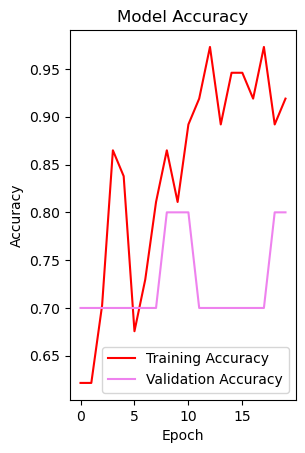

In [21]:
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', color='red')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='violet')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

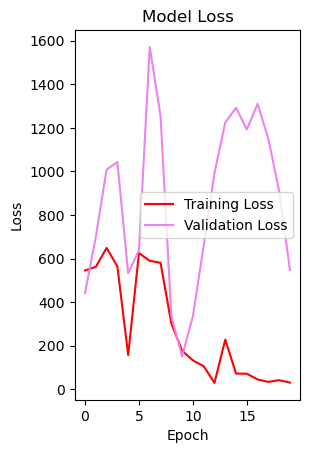

In [22]:
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss', color='red')
plt.plot(history.history['val_loss'], label='Validation Loss', color='violet')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model Evaluation

In [23]:
# Make predictions on the test set
predictions=model.predict(X_test)
predicted_classes=np.argmax(predictions, axis=1)
true_classes=np.argmax(y_test, axis=1)

1/1 [==============================] - 0s 139ms/step


In [24]:
# Calculate precision, recall, and F1 score
precision, recall, f1_score, _= precision_recall_fscore_support(true_classes, predicted_classes, average='macro')


In [25]:
# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=['Bedroom', 'Products']))

              precision    recall  f1-score   support

     Bedroom       0.78      1.00      0.88         7
    Products       1.00      0.33      0.50         3

    accuracy                           0.80        10
   macro avg       0.89      0.67      0.69        10
weighted avg       0.84      0.80      0.76        10



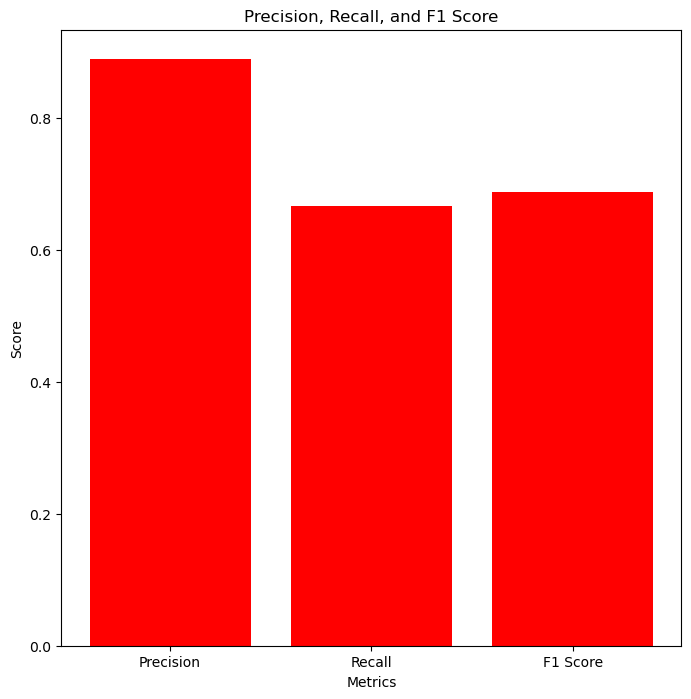

In [26]:
plt.figure(figsize=(8, 8))
plt.bar(['Precision', 'Recall', 'F1 Score'], [precision, recall, f1_score], color=['red', 'red', 'red'])
plt.title('Precision, Recall, and F1 Score')
plt.xlabel('Metrics')
plt.ylabel('Score')
plt.show()

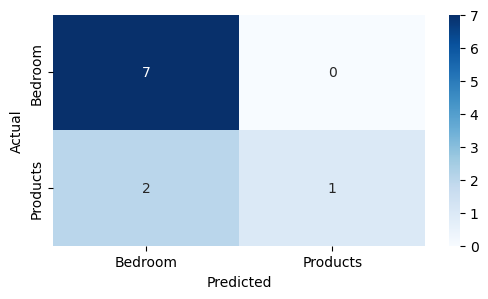

In [27]:
# Plot confusion matrix
cm=confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(6, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Bedroom', 'Products'], yticklabels=['Bedroom', 'Products'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

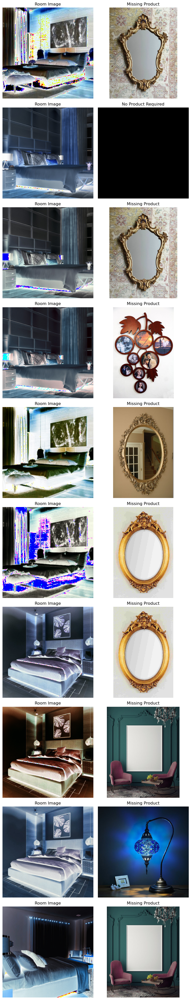

In [28]:
# Recommendation based on predictions
fig, axes=plt.subplots(len(X_test), 2, figsize=(8, 4 * len(X_test)))

for i in range(len(X_test)):
    roomimage=Image.fromarray((images[i] * 255).astype(np.uint8))
    axes[i, 0].imshow(roomimage)
    axes[i, 0].set_title('Room Image')
    axes[i, 0].axis('off')

    if np.argmax(predictions[i]) == 0:
        product_image = Image.open(os.path.join(Directory2, np.random.choice(os.listdir(Directory2))))
        axes[i, 1].imshow(product_image)
        axes[i, 1].set_title('Missing Product')
        axes[i, 1].axis('off')
    else:
        axes[i, 1].imshow(np.zeros((224, 224, 3)))
        axes[i, 1].set_title('No Product Required')
        axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [35]:
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

In [36]:
base_model=InceptionV3(weights='imagenet')
model=Model(inputs=base_model.input, outputs=base_model.get_layer('avg_pool').output)

In [37]:
def extract_features(img_path, model):
    img=image.load_img(img_path, target_size=(299, 299))
    img_data=image.img_to_array(img)
    img_data=np.expand_dims(img_data, axis=0)
    img_data=preprocess_input(img_data)
    
    features=model.predict(img_data)
    return features.flatten()

In [38]:
# Extract features for all room images
room_features={}
for img_name in os.listdir(Directory1):
    img_path=os.path.join(Directory1, img_name)
    room_features[img_name]=extract_features(img_path, model)

1/1 [==============================] - 0s 105ms/step


In [39]:
# Extract features for all product images
product_features={}
for img_name in os.listdir(Directory2):
    img_path=os.path.join(Directory2, img_name)
    product_features[img_name]=extract_features(img_path, model)

1/1 [==============================] - 0s 120ms/step


In [58]:
# Calculate similarity and recommend products
recommendations={}

for room_img, room_feat in room_features.items():
    similarities={}
    for product_img, product_feat in product_features.items():
        similarity=cosine_similarity([room_feat], [product_feat])
        similarities[product_img]=similarity[0][0]
    
    # Sort products by similarity score (lowest first for dissimilarity)
    sorted_products=sorted(similarities.items(), key=lambda item: item[1])
    recommendations[room_img]=[product for product, similarity_score in sorted_products]

In [59]:
def display_images(room_img, recommended_products):
    num_products = len(recommended_products)
    fig, axes = plt.subplots(1, num_products + 1, figsize=(20, 5))
    room_img_path = os.path.join(Directory1, room_img)
    room_img_data = image.load_img(room_img_path)
    axes[0].imshow(room_img_data)
    axes[0].set_title("Room")
    axes[0].axis('off')
    for i, product_img in enumerate(recommended_products):
        product_img_path = os.path.join(Directory2, product_img)
        product_img_data = image.load_img(product_img_path)
        axes[i + 1].imshow(product_img_data)
        axes[i + 1].set_title(f"Product {i+1}")
        axes[i + 1].axis('off')
    plt.tight_layout()
    plt.show()

### Recommendation of Products for Rooms

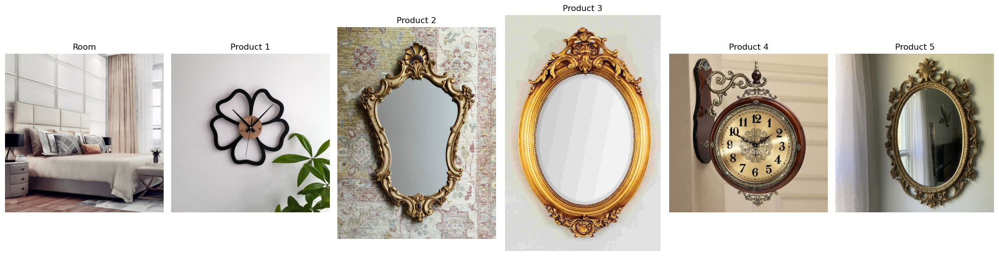

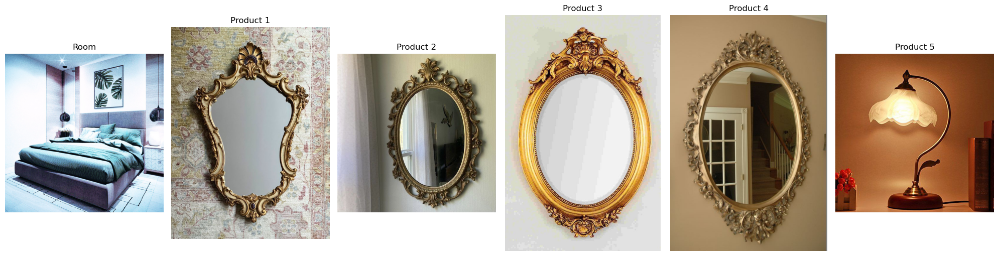

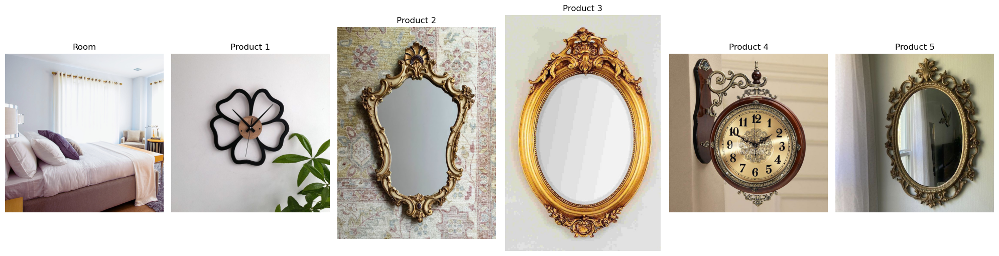

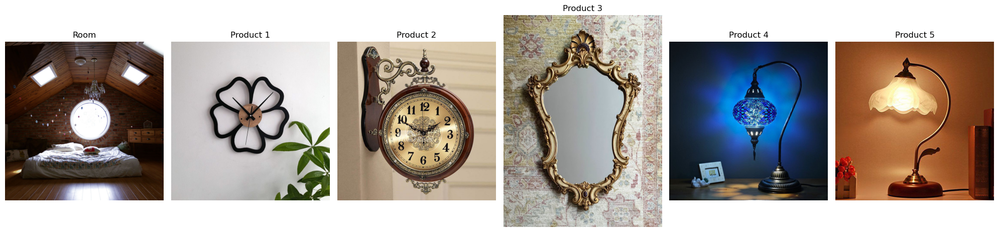

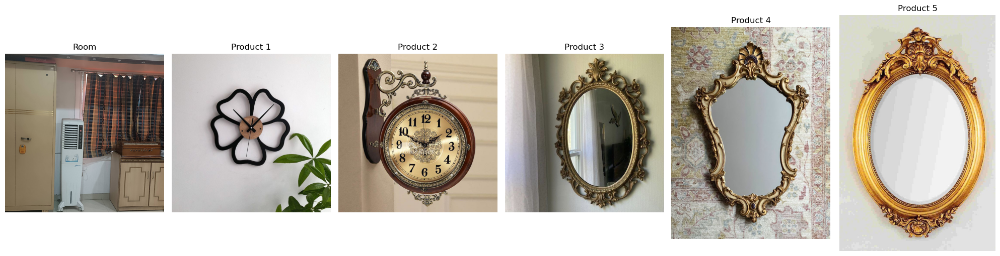

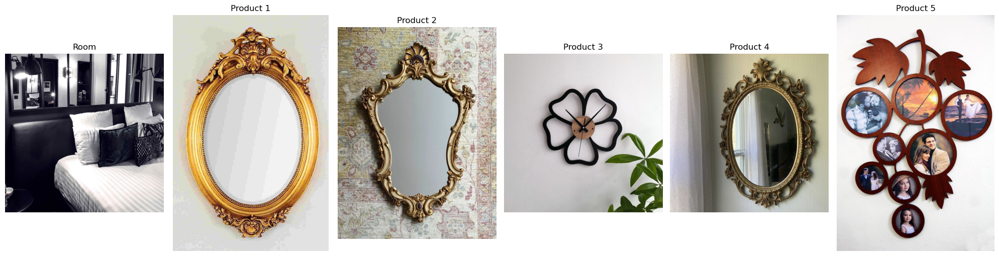

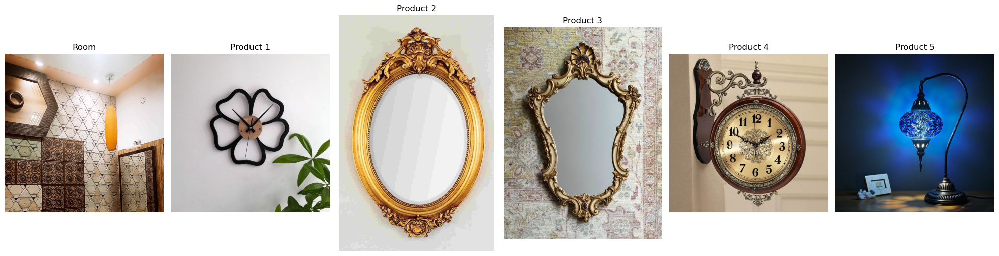

In [61]:
room_images_list = list(recommendations.keys())
for i in range(2, len(room_images_list), 5):
    display_images(room_images_list[i], recommendations[room_images_list[i]][:5])